# Technical assessment : NBA Players career forecast

### Author : Wessim Slimi
### Date : Jun 20 2021

In [9]:
# imports
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from tqdm.notebook import tqdm
from scipy import stats
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import roc_curve, auc, confusion_matrix, f1_score
from catboost import CatBoostClassifier, Pool
import copy
import shap
# configurations
pd.set_option("display.max_columns", None)
plt.style.use('fivethirtyeight')


# constants and paths
data_path = './nba_logreg.csv'
figsize = (20,20)
target = 'TARGET_5Yrs'
test_split = 0.2

In [10]:
# Defining functions

def get_class_weights(arr, labels = [0,1]):
    """
    Calculates class weights for multi class 
    
    Parameter : 
        arr (numpy.array) : array containing target variable
        labels (list) : list of classes
    
    Returns:
        class_weights (dict) : dict containing class label as key 
                               and it's corresponding weight as values  
    """
    class_weights = {}
    for label in labels:
        try:
            class_weights[label] = len(arr) / (2*len(arr[arr==label]))
        except ValueError as e:
            print('Error Could not calculate class weights. There is maybe a division by 0 please verify that all the classes exists. Traceback below \n'.format(e))
    return class_weights

def plot_evaluation(model, y_test, y_pred):
    """
    Plot 3 plots : Raw Confusion Matrix, Normalized Confusion Matrix, and Roc Curve

    Parameters:
        - model (can be any that accepts a fit method classifier) : used model
        - y_test (numpy array) : testing array containing ground truth
        - y_pred (numpy array) : predicted classes
    Returns:
        - None
    """
    confusion_matrix(y_test, y_pred)
    conf_mat = confusion_matrix(np.array(y_test), np.array(y_pred))
    N_0 = len(y_test.values[y_test.values ==0])
    N_1 = len(y_test.values[y_test.values ==1])
    mat = np.zeros((2,2))
    mat[0] = conf_mat[0]/(conf_mat[0,0]+conf_mat[0,1])
    mat[1] = conf_mat[1]/(conf_mat[1,0]+conf_mat[1,1])
    # Confusion Matrix
    plt.figure(figsize=(18,4))
    plt.subplot(131)
    plt.title('True Confusion matrix \n F1:{:.2f}'.format(f1_score(np.array(y_test), np.array(y_pred))))
    sns.heatmap(conf_mat, annot=True)
    plt.subplot(132)
    plt.title('Weighted Confusion matrix \n F1:{:.2f}'.format(f1_score(np.array(y_test), np.array(y_pred))))
    sns.heatmap(mat, annot=True)
    # ROC curse and AUC
    fpr, tpr, thresholds = roc_curve(y_test, y_pred)
    auc_value = auc(fpr, tpr)
    plt.subplot(133)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.plot(fpr, tpr, label='(area = {:.3f})'.format(auc_value))
    plt.xlabel('False positive rate')
    plt.ylabel('True positive rate')
    plt.title('ROC curve \n AUC : {}'.format(auc_value))
    plt.legend(loc='best')
  

def box_cox_transform(data):
    """
    Performs a box cox transformation. 
    This transformation is used to transform features in a "more" Gaussian distribution

    Parameters:
        - data (dataframe) : containing data

    Returns:
        - df (dataframe) : containing transformed data
        - dict_lambdas (dict) : dict containing corresponding lambda to each variable. Used for reverse transformation
    """
    df = copy.deepcopy(data)
    dict_lambdas = {}
    for col in tqdm(data.columns):
        if col == target:
            pass
        else:
            df[col], dict_lambdas[col] = stats.boxcox(data[col].values + np.abs(np.min(data[col].values))+1)
    return df, dict_lambdas


def cramers_v(x, y):
    """
    Cramers'V (Similar to correlation factor but for Categorical Data)

    :param x : first array
    :param y : second array
    :result  : float Cramer V test
    """
    confusion_matrix = pd.crosstab(x,y)
    chi2 = stats.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2-((k-1)*(r-1))/(n-1))
    rcorr = r-((r-1)**2)/(n-1)
    kcorr = k-((k-1)**2)/(n-1)
    del confusion_matrix
    del chi2
    del phi2
    del n
    return np.sqrt(phi2corr/min((kcorr-1),(rcorr-1)))

## 1. Reading and visualizing Data

In [39]:
# reading data
raw_data = pd.read_csv(data_path)

# filling null values
raw_data['3P%'] = raw_data['3P%'].fillna(0)

# dropping 'Name' variable
raw_data.drop('Name', axis=1, inplace=True)

# dropping outliers
# the values we keep are values between (mean - 4*std) and (mean + 4*std)
raw_data = raw_data[(np.abs(stats.zscore(raw_data)) < 4).all(axis=1)]

# changing Target dtype from float to integer
raw_data[target] = raw_data[target].astype(int)

nb_rows, nb_columns = len(raw_data), len(raw_data.columns)
columns = raw_data.columns
print("Data Shape : ({}, {})".format(nb_columns, nb_rows))
raw_data.head(20)



Data Shape : (20, 1340)


,GP,MIN,PTS,FGM,FGA,FG%,3P Made,3PA,3P%,FTM,FTA,FT%,OREB,DREB,REB,AST,STL,BLK,TOV,TARGET_5Yrs
0,36,27.4,7.4,2.6,7.6,34.7,0.5,2.1,25.0,1.6,2.3,69.9,0.7,3.4,4.1,1.9,0.4,0.4,1.3,0
1,35,26.9,7.2,2.0,6.7,29.6,0.7,2.8,23.5,2.6,3.4,76.5,0.5,2.0,2.4,3.7,1.1,0.5,1.6,0
2,74,15.3,5.2,2.0,4.7,42.2,0.4,1.7,24.4,0.9,1.3,67.0,0.5,1.7,2.2,1.0,0.5,0.3,1.0,0
3,58,11.6,5.7,2.3,5.5,42.6,0.1,0.5,22.6,0.9,1.3,68.9,1.0,0.9,1.9,0.8,0.6,0.1,1.0,1
4,48,11.5,4.5,1.6,3.0,52.4,0.0,0.1,0.0,1.3,1.9,67.4,1.0,1.5,2.5,0.3,0.3,0.4,0.8,1
5,75,11.4,3.7,1.5,3.5,42.3,0.3,1.1,32.5,0.4,0.5,73.2,0.2,0.7,0.8,1.8,0.4,0.0,0.7,0
6,62,10.9,6.6,2.5,5.8,43.5,0.0,0.1,50.0,1.5,1.8,81.1,0.5,1.4,2.0,0.6,0.2,0.1,0.7,1
7,48,10.3,5.7,2.3,5.4,41.5,0.4,1.5,30.0,0.7,0.8,87.5,0.8,0.9,1.7,0.2,0.2,0.1,0.7,1
8,65,9.9,2.4,1.0,2.4,39.2,0.1,0.5,23.3,0.4,0.5,71.4,0.2,0.6,0.8,2.3,0.3,0.0,1.1,0
9,42,8.5,3.7,1.4,3.5,38.3,0.1,0.3,21.4,1.0,1.4,67.8,0.4,0.7,1.1,0.3,0.2,0.0,0.7,0


## 2. Data Viz

### 2.1. Scatter plots & distribution plot

Here we plot each variable accros each other, and in the diagonal a distribution plot of each variable. We are adding another level of detail by coloring each observation by its label 0 for blue and 1 for red. <br/>

First, when looking to scatter plots, we are looking especially for some kind of correlations between variables. e.g. FGM & PTS are highly correlated variables we will need to remove them. One can check Pearson R² values for this <br/>
Second we will look for some kind of way to seperate the red observations from the blue ones. If we can do so by drawing a line we could safely assume that our variable brings information about the classification. <br/><br/> 
Third, when looking for variables distributions - across the diagonal - we will look to see if the the statistical moments (mean, std ..) of the variable's  distribution change from label 0 to label 1, if so, we can safely assume that our variable is a great candidate to be used in binary classification.<br/> 
eg: for high values of GP we clearly see a difference between red and blue distribution, thus we can say that the higher the variable GP is, the higher chances to classify the observation by 1. <br/>
We also will look for some tailed shape distribtion, if we find some, we will be removing outliers after. <br/><br/> 
Finally, If we were using a linear model eg. Logistic regression, we should also look if our variables have a  Gaussian shape. If not one should apply log transform, or Box Cox transform on the data before normalization/standerdization


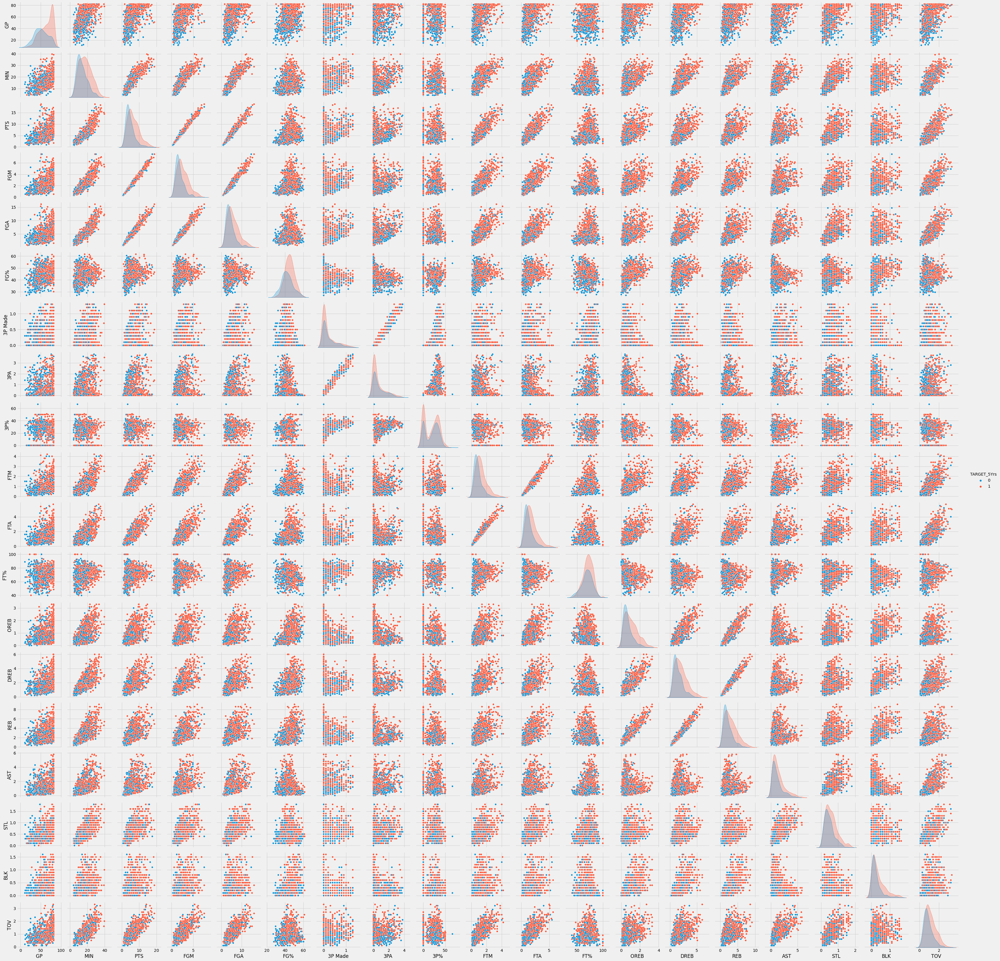

In [ ]:
sns.pairplot(raw_data, hue=target, diag_kind="kde", height=2.5)

### 2.2. Box plot

Box plots brings information about Quartiles. This is especially used to see if we have outliers.

  0%|          | 0/20 [00:00<?, ?it/s]

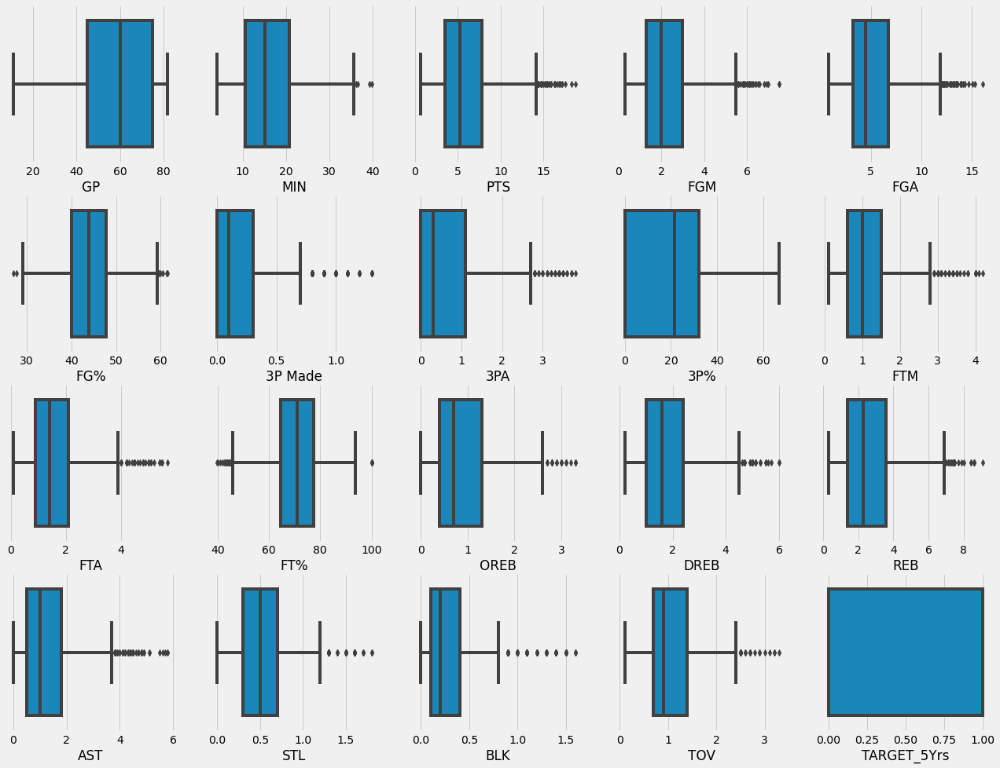

In [ ]:
plt.figure(figsize=figsize)
for i in tqdm(range(nb_columns)):
    plt.subplot(5,5,i+1)
    column = raw_data.columns[i]
    ax = sns.boxplot(x=column, data = raw_data)#, hue=target)


### 2.3. Correlation Matrix

Pearson Correlation matrix shows first order correlation between variables. When we have twho highly correlated variables, we should remove one of them to improve model's performance versus overfitting.

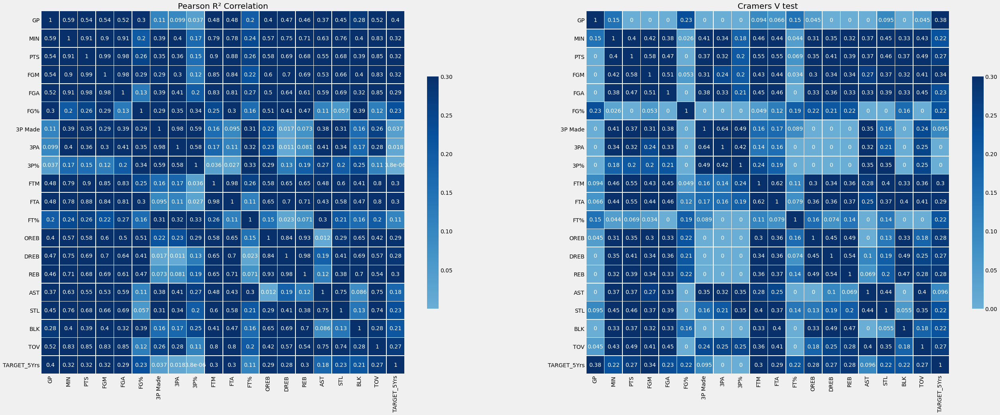

In [40]:
# Compute the correlation matrix
corr = np.abs(raw_data.corr())

# Compute Cramer's V test matrix
corrMatrix_disc  = np.ones((nb_columns,nb_columns))
for i in tqdm(range(nb_columns)):
  for j in range(i+1, nb_columns):
    val = cramers_v(raw_data[raw_data.columns[i]].values, raw_data[raw_data.columns[j]].values)
    corrMatrix_disc[i,j] = val
    corrMatrix_disc[j,i] = val
cramer_df = pd.DataFrame(corrMatrix_disc, columns=columns).set_index(columns)
plt.figure(figsize=(40,20))
plt.subplot(121)
plt.title('Pearson R² Correlation')
sns.heatmap(corr, vmax=.3, center=0,
            square=True, linewidths=.5, annot=True, cbar_kws={"shrink": .5}, cmap='Blues')

plt.subplot(122)
plt.title('Cramers V test')
sns.heatmap(cramer_df, vmax=.3, center=0,
            square=True, linewidths=.5, annot=True, cbar_kws={"shrink": .5}, cmap='Blues')


## 3. Creating Dataset

First thing to consider is to see if the information given by the dataset are average statistics per game or sum of flat statistics (eg: PTS points scored per game or points scored accross the season). There was no further information given by the problem statement. Therefore, after checking some of the stats, we assumed that they are an average performance per game. If not, we should remove first order correlation by dividing by number of games played. 

Note : There is no need for Standerdizing the data or applying Log transform or Box Cox transform because we are using tree based model.

In [89]:
# data prep
# FGM & FGA are highly correlated to PTS therefore we must remove them to prevent overfitting
cols_to_drop = [target, 'FGA', 'FGM'] 
highly_correlated_variables = cramer_df[cramer_df[target].values>0.15].index
cols_to_drop = [x for x in cols_to_drop if x in highly_correlated_variables]
X = raw_data[highly_correlated_variables].drop(cols_to_drop, axis=1)
y = raw_data[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_split)

# class weights
class_weights = get_class_weights(y)

In [98]:
# hyper parameters tuning by Gridsearch

parameters = {
    'iterations' : [4000],
    'loss_function' : ['Logloss'],
    'depth' : [3,4,5,6,7],
    'early_stopping_rounds' : [50],
    'verbose' : [False],
}

model = CatBoostClassifier()

clf = GridSearchCV(model, parameters, verbose=3)
clf.fit(X_train.values, y_train.values)

best_params = clf.best_params_

Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV] depth=3, early_stopping_rounds=50, iterations=4000, loss_function=Logloss, verbose=False 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  depth=3, early_stopping_rounds=50, iterations=4000, loss_function=Logloss, verbose=False, score=0.693, total=   4.1s
[CV] depth=3, early_stopping_rounds=50, iterations=4000, loss_function=Logloss, verbose=False 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    4.1s remaining:    0.0s


[CV]  depth=3, early_stopping_rounds=50, iterations=4000, loss_function=Logloss, verbose=False, score=0.698, total=   4.1s
[CV] depth=3, early_stopping_rounds=50, iterations=4000, loss_function=Logloss, verbose=False 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    8.2s remaining:    0.0s


[CV]  depth=3, early_stopping_rounds=50, iterations=4000, loss_function=Logloss, verbose=False, score=0.734, total=   4.0s
[CV] depth=3, early_stopping_rounds=50, iterations=4000, loss_function=Logloss, verbose=False 
[CV]  depth=3, early_stopping_rounds=50, iterations=4000, loss_function=Logloss, verbose=False, score=0.626, total=   4.1s
[CV] depth=3, early_stopping_rounds=50, iterations=4000, loss_function=Logloss, verbose=False 
[CV]  depth=3, early_stopping_rounds=50, iterations=4000, loss_function=Logloss, verbose=False, score=0.659, total=   4.0s
[CV] depth=4, early_stopping_rounds=50, iterations=4000, loss_function=Logloss, verbose=False 
[CV]  depth=4, early_stopping_rounds=50, iterations=4000, loss_function=Logloss, verbose=False, score=0.679, total=   5.3s
[CV] depth=4, early_stopping_rounds=50, iterations=4000, loss_function=Logloss, verbose=False 
[CV]  depth=4, early_stopping_rounds=50, iterations=4000, loss_function=Logloss, verbose=False, score=0.693, total=   5.3s
[CV] 

[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed:  3.3min finished


In [99]:
best_params

{'depth': 4,
 'early_stopping_rounds': 50,
 'iterations': 4000,
 'loss_function': 'Logloss',
 'verbose': False}

In [96]:
# defining model
model = CatBoostClassifier(
    iterations = 4000,
    loss_function = 'Logloss',
    learning_rate=0.005,
    depth = 4,
    class_weights = class_weights,
    early_stopping_rounds = 50,
)

model.fit(
    X_train, y_train,
    eval_set=(X_test, y_test),
    plot=True,
    use_best_model=True,
    verbose=1
)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6922511	test: 0.6921337	best: 0.6921337 (0)	total: 1.78ms	remaining: 7.14s
1:	learn: 0.6913933	test: 0.6912157	best: 0.6912157 (1)	total: 4.56ms	remaining: 9.12s
2:	learn: 0.6905348	test: 0.6902565	best: 0.6902565 (2)	total: 6.86ms	remaining: 9.13s
3:	learn: 0.6896603	test: 0.6893259	best: 0.6893259 (3)	total: 8.76ms	remaining: 8.75s
4:	learn: 0.6888150	test: 0.6884387	best: 0.6884387 (4)	total: 10.6ms	remaining: 8.48s
5:	learn: 0.6878893	test: 0.6874550	best: 0.6874550 (5)	total: 12.4ms	remaining: 8.28s
6:	learn: 0.6870583	test: 0.6865856	best: 0.6865856 (6)	total: 14.3ms	remaining: 8.17s
7:	learn: 0.6862104	test: 0.6857802	best: 0.6857802 (7)	total: 16.1ms	remaining: 8.05s
8:	learn: 0.6855718	test: 0.6850537	best: 0.6850537 (8)	total: 18ms	remaining: 7.98s
9:	learn: 0.6846255	test: 0.6839748	best: 0.6839748 (9)	total: 20.1ms	remaining: 8.01s
10:	learn: 0.6838225	test: 0.6830671	best: 0.6830671 (10)	total: 21.9ms	remaining: 7.96s
11:	learn: 0.6830334	test: 0.6823280	best: 

## 4. Model Evaluation

In a context of investment, the worse scenario is losing money, we will need then, to minimize at the most our loss on investment. In this case this situation will be investing in a player who will not make it in the future. <br/>
ie: True label = 0, Predicted label = 1.<br/><br/>
Therefore, the most important metric to follow is the False positive rate $ FPR = \frac{FP}{TP+FP}$. We should minimize this metric as much as possible.<br/><br/>

It is okay if we miss prediction on some players as False Negative. Surely it will be a loss of earnings, be we will not loose money. Because, investing on a player who may or may not make it to the NBA is far worse than missing some feature players in term of the number of raw investment. This reasoning can drastically change if we would have been predicting the return on investment rather than just a boolean prediction of whether or not the player will go to NBA. In fact, if we were predicting how much money hiring a player could make us win, we could consider more than just TPR.

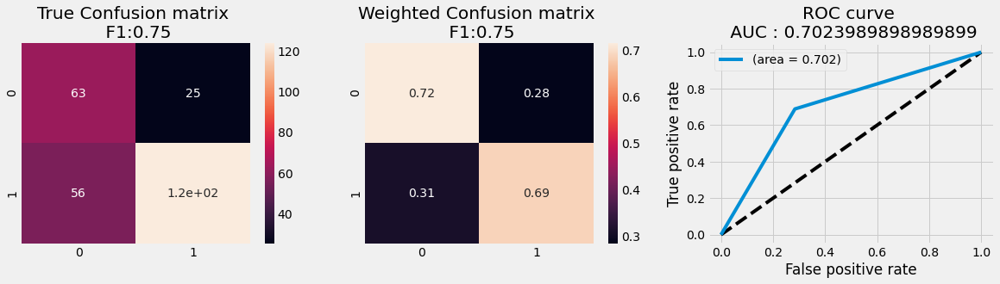

In [97]:
y_pred = model.predict(X_test)
plot_evaluation(model, y_test=y_test, y_pred=y_pred)

## 5. Explaining The model

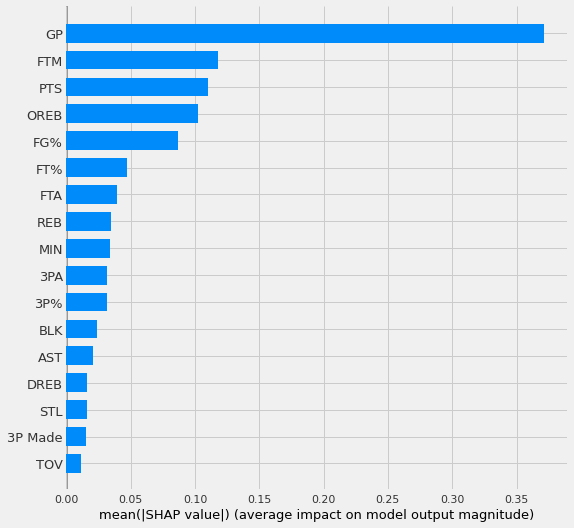

In [ ]:
# load JS visualization code to notebook
explainer = shap.TreeExplainer(model)
expected_value = explainer.expected_value
shap_values = explainer.shap_values(Pool(X_train, y_train))
# summarize the effects of all the features
shap.summary_plot(shap_values, X_train, plot_type="bar", max_display=X_train.shape[1])

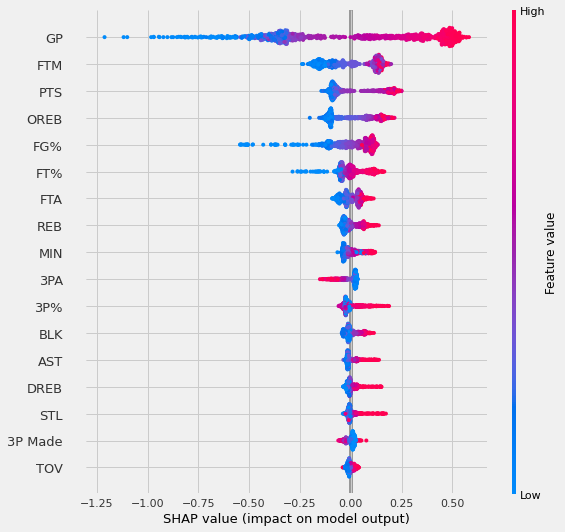

In [ ]:
# summarize the effects of all the features
plot_html = shap.summary_plot(shap_values, X_train)

#### Example of analysis of the top 3 shap values
* According to our model the most important feature is GP :  Games played, ~35% of the prediction is based on this variable
> ie: The higher the player plays games (in red) the more he will have a chance to have a career superior than 5 years (right)

* Second most important variable is FTM : Free throw made.
> The better a player is in scoring free throws (red) the more he will have a chance to have a career superior than 5 years (right)

* Third most important variable is PTS: Points per game.
> This is quiet obvious, the more a player scores points the more he will be noticed and the more he will have a 5 years or more career
